In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt # Visualization
import seaborn as sns #Visualization
plt.rcParams['figure.figsize'] = [8,5]
plt.rcParams['font.size'] =14
plt.rcParams['font.weight']= 'bold'
import scipy 
from scipy import stats 
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import math
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from scipy import stats
import warnings
warnings.filterwarnings("ignore")
from sklearn import preprocessing
def optimal_number_of_clusters(data):
        # FUNCTIONS
        cost = []
        for n in range(1, 20):
            kmeans = KMeans(n_clusters=n)
            kmeans.fit(X=data)
            cost.append(kmeans.inertia_)
        x1, y1 = 2, cost[0]
        x2, y2 = 20, cost[len(cost)-1]
        distances = []
        for i in range(len(cost)):
            x0 = i+2
            y0 = cost[i]
            numerator = np.abs((y2-y1)*x0 - (x2-x1)*y0 + x2*y1 - y2*x1)
            denominator = np.sqrt((y2 - y1)**2 + (x2 - x1)**2)
            distances.append(numerator/denominator)
        n_clusters = distances.index(max(distances)) + 2
        plt.plot(range(1, 20), cost, "--o")
        plt.plot(n_clusters, cost[n_clusters-1], "o", color="red")
        plt.xlabel("Number of Clusters")
        plt.ylabel("Squared Error")
        plt.show()
        return n_clusters
import pickle
from sklearn.cluster import KMeans
from mpl_toolkits import mplot3d
from matplotlib import cm


In [66]:
df = pd.read_csv("data.csv", index_col=0)

df = df[['Year','Month','RSI_10','STOCHRSIk_8_8_8_5','STOCHRSId_8_8_8_5','stochCross']]
df.info()

#Split Train vs Test -> 50% vs 50%
train = df.loc[(df['Year'] == 2008)]
test = df.loc[(df['Year'] == 2009) ]
test

<class 'pandas.core.frame.DataFrame'>
Index: 287403 entries, 26 to 287428
Data columns (total 6 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Year               287403 non-null  int64  
 1   Month              287403 non-null  int64  
 2   RSI_10             287403 non-null  float64
 3   STOCHRSIk_8_8_8_5  287403 non-null  float64
 4   STOCHRSId_8_8_8_5  287403 non-null  float64
 5   stochCross         287403 non-null  int64  
dtypes: float64(3), int64(3)
memory usage: 15.3 MB


,Year,Month,RSI_10,STOCHRSIk_8_8_8_5,STOCHRSId_8_8_8_5,stochCross
249809,2009,1,52.422590,60.785314,35.785314,0
249810,2009,1,53.259248,73.285314,48.285314,0
249811,2009,1,53.215948,85.582890,60.744829,0
249812,2009,1,53.041941,96.893423,72.966451,0
249813,2009,1,53.172567,97.580351,82.825458,0
...,...,...,...,...,...,...
287424,2009,2,39.702767,52.761437,57.206201,-1
287425,2009,2,39.665236,46.340287,54.653274,0
287426,2009,2,39.590386,34.377286,49.808029,0
287427,2009,2,39.553067,21.877286,42.627373,0


In [67]:
print("Standardize Features")
df = df[['RSI_10','STOCHRSIk_8_8_8_5','STOCHRSId_8_8_8_5','stochCross']]
chars = df.columns
from sklearn.preprocessing import StandardScaler
sc = StandardScaler().set_output(transform="pandas")

# Fit only on Train sample
train_transformed = sc.fit_transform(train[chars])
print(train_transformed)
# Transform Test sample
test_transformed = sc.transform(test[chars])
print("")

Standardize Features
          RSI_10  STOCHRSIk_8_8_8_5  STOCHRSId_8_8_8_5  stochCross
26     -2.054724          -0.428525           0.350776   -0.000127
27     -2.022670          -0.529897           0.040168   -0.000127
28     -2.046681          -0.872010          -0.319110   -0.000127
29     -2.038658          -0.570345          -0.509962   -0.000127
30     -2.038658          -0.291051          -0.583096   -0.000127
...          ...                ...                ...         ...
249804  0.381832          -2.139261          -2.316978   -0.000127
249805  0.393435          -1.676175          -2.216667   -0.000127
249806  0.405102          -1.139467          -2.000098   -0.000127
249807  0.420759          -0.602759          -1.667270   -0.000127
249808  0.420759          -0.066051          -1.218184   -0.000127

[249783 rows x 4 columns]



Explained variance ratio
[0.48157789 0.25005421 0.23601099 0.0323569 ]


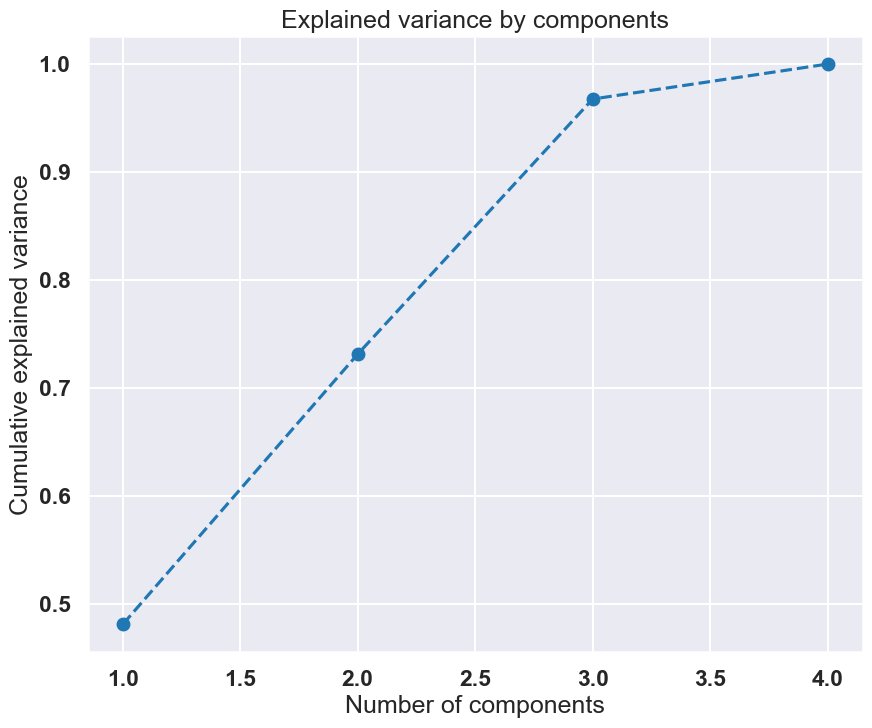

Perform PCA with n components
Generate scores
               0         1         2         3
0      -0.103333  2.044822  0.187268 -0.549114
1      -0.385635  2.012898  0.124636 -0.396980
2      -0.864764  2.040100 -0.001660 -0.375914
3      -0.794410  2.026224  0.061592 -0.031896
4      -0.657727  2.021333  0.131302  0.212619
...          ...       ...       ...       ...
249778 -3.029503 -0.357401 -0.866906  0.182944
249779 -2.649016 -0.375733 -0.731099  0.430117
249780 -2.138584 -0.394639 -0.563616  0.644932
249781 -1.547483 -0.416831 -0.385244  0.776711
249782 -0.876277 -0.422840 -0.193392  0.825420

[249783 rows x 4 columns]
Export pickle file

# number of components
Most important components


,0,1
0,PC0,STOCHRSId_8_8_8_5
1,PC1,RSI_10
2,PC2,stochCross
3,PC3,STOCHRSId_8_8_8_5


In [68]:
print("Explained variance ratio")
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(train_transformed)

print(pca.explained_variance_ratio_)

plt.figure(figsize=(10,8))
plt.plot(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_.cumsum(), marker = "o", linestyle = "--")
plt.title("Explained variance by components")
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.show()


pca = PCA(n_components=4)
print("Perform PCA with n components")
pca.fit(train_transformed)
print("Generate scores")
scores_pca = pca.transform(train_transformed)
Scores = pd.DataFrame(scores_pca)
print(Scores)
print("Export pickle file")


filename = 'PCA.sav'
pickle.dump(pca, open(filename, 'wb'))

print("")
print("# number of components")
n_pcs= pca.components_.shape[0]
n_pcs

# get the index of the most important feature on EACH component
# LIST COMPREHENSION HERE
most_important = [np.abs(pca.components_[i]).argmax() for i in range(n_pcs)]
print("Most important components")
most_important


initial_feature_names = chars
# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]

# LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

# build the dataframe
dff = pd.DataFrame(dic.items())
dff


# OPTIMAL NUMBER OF CLUSTERS CALCULATION


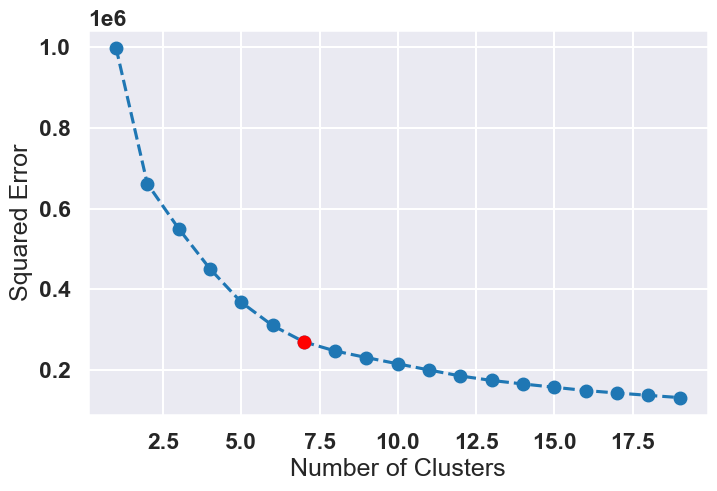

In [69]:
print("# OPTIMAL NUMBER OF CLUSTERS CALCULATION")
n_clusters = optimal_number_of_clusters(scores_pca)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249783 entries, 0 to 249782
Data columns (total 10 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Year               249783 non-null  int64  
 1   Month              249783 non-null  int64  
 2   RSI_10             249783 non-null  float64
 3   STOCHRSIk_8_8_8_5  249783 non-null  float64
 4   STOCHRSId_8_8_8_5  249783 non-null  float64
 5   stochCross         249783 non-null  int64  
 6   0                  249783 non-null  float64
 7   Component1         249783 non-null  float64
 8   Component2         249783 non-null  float64
 9   Component3         249783 non-null  float64
dtypes: float64(7), int64(3)
memory usage: 19.1 MB
None


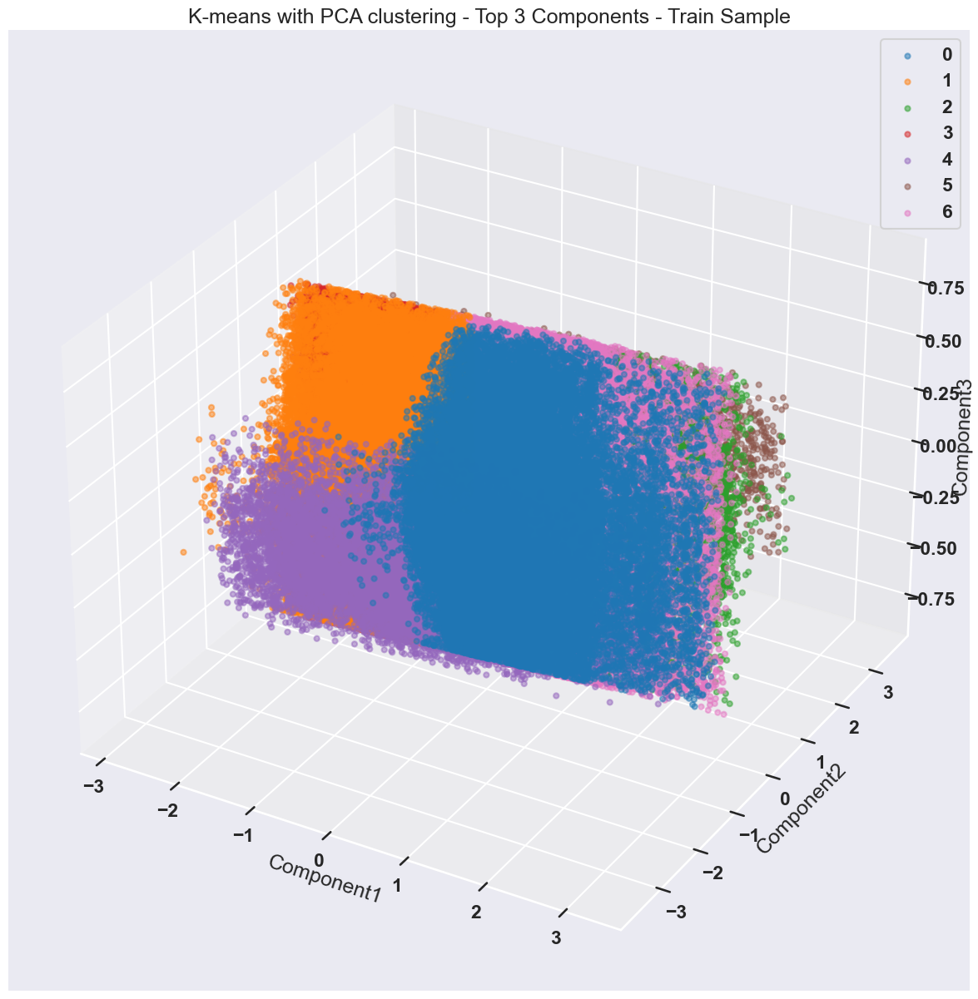

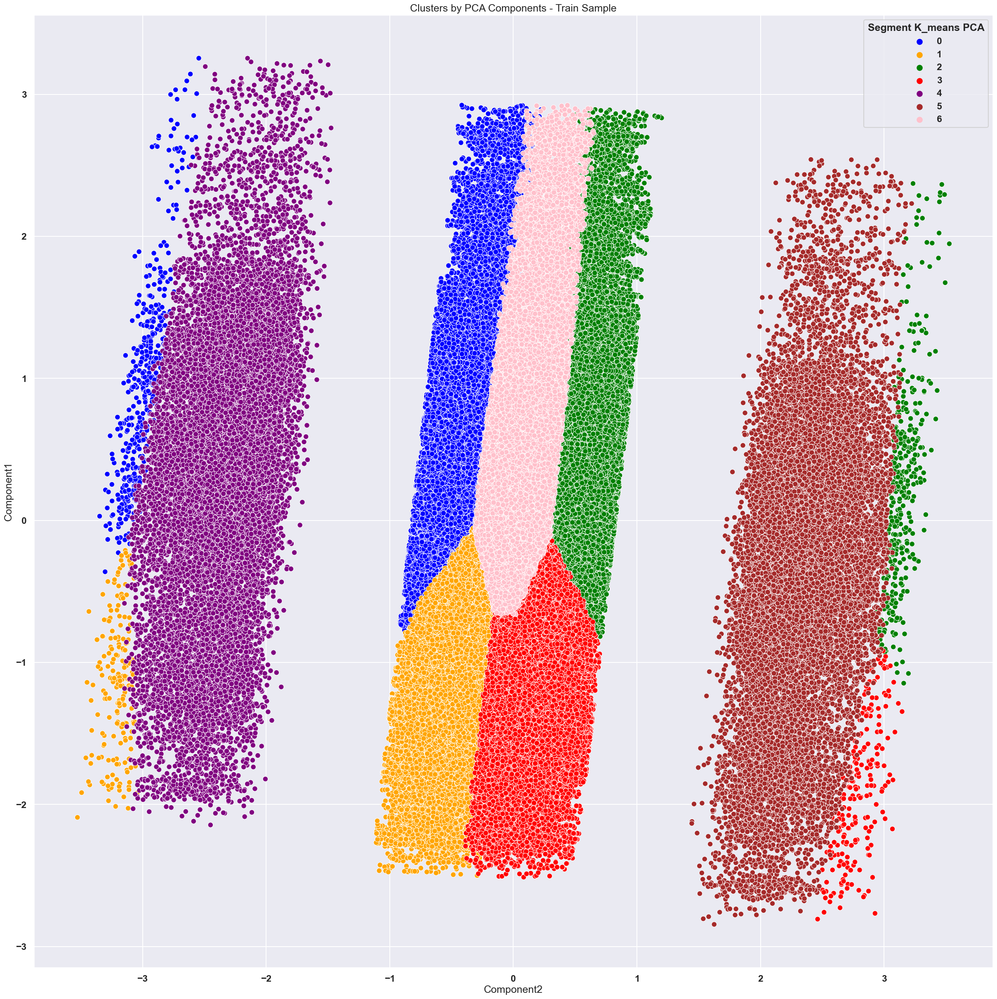

In [70]:
kmeans_pca = KMeans(n_clusters = 7, init="k-means++", random_state=42)
kmeans_pca.fit(scores_pca)

filename = 'kmeans_pca.sav'
pickle.dump(kmeans_pca, open(filename, 'wb'))
        
df_train = pd.concat([train.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
df_train.columns.values[-3:] = [
    
    "Component1",
    "Component2",
    "Component3"
    ]        

print(df_train.info())    
df_train['Segment K_means PCA'] = kmeans_pca.labels_

# =============================================================================
# Visualize clsuters for top 3 components - Train Sample
# =============================================================================


fig = plt.figure(figsize=(15,15))

ax = plt.axes(projection='3d')

df_train = df_train.sort_values(by=['Segment K_means PCA'])

for s in df_train['Segment K_means PCA'].unique():
    ax.scatter(df_train.Component1[df_train['Segment K_means PCA']==s],df_train.Component2[df_train['Segment K_means PCA']==s],df_train.Component3[df_train['Segment K_means PCA']==s],label=s, alpha=0.5)
sns.set_style("darkgrid")
sns.set_context("talk")  
plt.xlabel("Component1")
plt.ylabel("Component2")
plt.title("K-means with PCA clustering - Top 3 Components - Train Sample")
ax.set_zlabel("Component3")
ax.legend()
plt.show()


x_axis = df_train['Component2']
y_axis = df_train['Component1']
plt.figure(figsize=(30,30))

sns.scatterplot(x=x_axis, y=y_axis, hue=df_train['Segment K_means PCA'], palette = ["blue","orange","green","red","purple","brown","pink","gray","olive","cyan"])
plt.title("Clusters by PCA Components - Train Sample")
plt.show()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37620 entries, 0 to 37619
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               37620 non-null  int64  
 1   Month              37620 non-null  int64  
 2   RSI_10             37620 non-null  float64
 3   STOCHRSIk_8_8_8_5  37620 non-null  float64
 4   STOCHRSId_8_8_8_5  37620 non-null  float64
 5   stochCross         37620 non-null  int64  
 6   0                  37620 non-null  float64
 7   Component1         37620 non-null  float64
 8   Component2         37620 non-null  float64
 9   Component3         37620 non-null  float64
dtypes: float64(7), int64(3)
memory usage: 2.9 MB
None


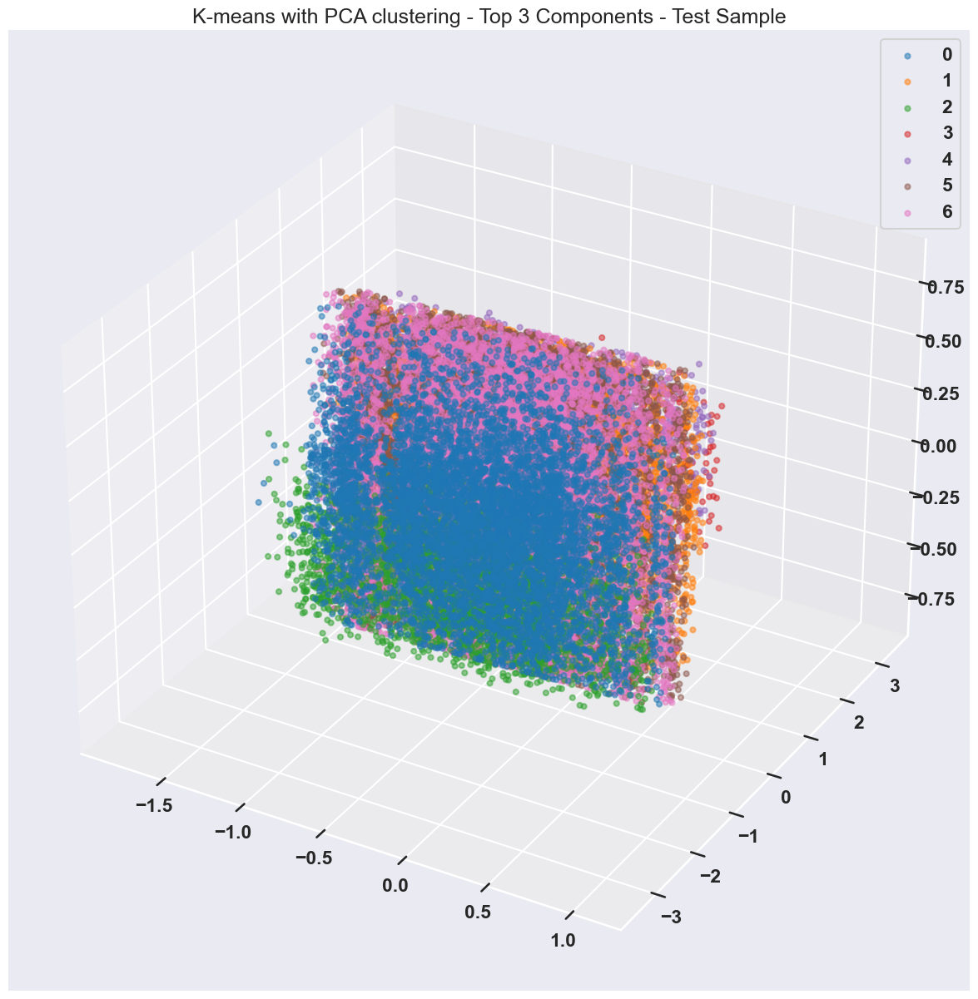

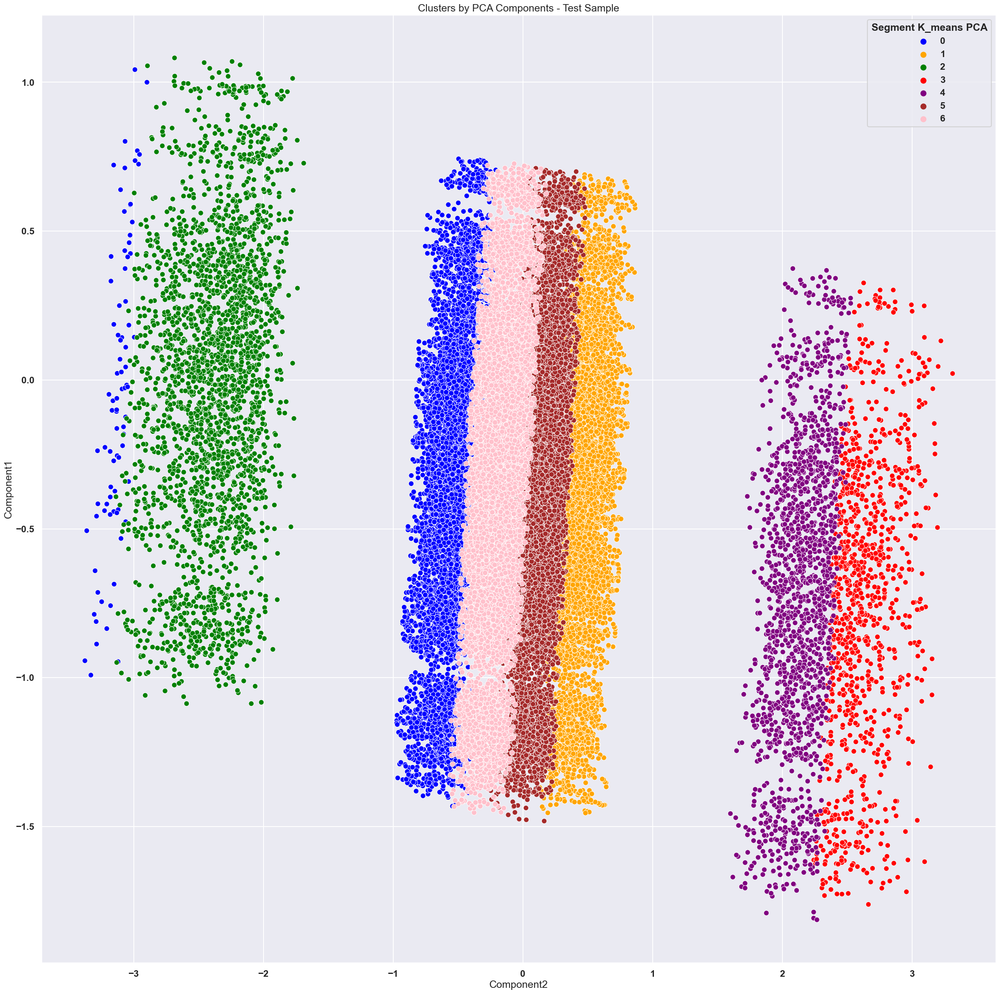

In [71]:
# =============================================================================
# Apply PCA to the Test Sample
# =============================================================================

# =============================================================================
# Load the pickle file
# =============================================================================
filename = 'PCA.sav'

pickle.dump(pca, open(filename, 'wb'))
pca = pickle.load(open(filename, 'rb'))

scores_pca = pca.transform(test_transformed)
Scores = pd.DataFrame(scores_pca)
Scores

# =============================================================================
# Generate K-Means clusters on Test sample
# =============================================================================
        
filename = 'kmeans_pca.sav'
KMeans_pca = pickle.load(open(filename, 'rb'))
KMeans_pca.fit_predict(scores_pca)
        
df_test = pd.concat([test.reset_index(drop=True), pd.DataFrame(scores_pca)], axis=1)
df_test.columns.values[-3:] = [
    
    "Component1",
    "Component2",
    "Component3"
    ]        

print(df_test.info())    
df_test['Segment K_means PCA'] = KMeans_pca.labels_



# =============================================================================
# Visualize clusters for top 3 components - Test Sample
# =============================================================================

fig = plt.figure(figsize=(15,15))

ax = plt.axes(projection='3d')

df_test = df_test.sort_values(by=['Segment K_means PCA'])

for s in df_test['Segment K_means PCA'].unique():
    ax.scatter(df_test.Component1[df_test['Segment K_means PCA']==s],df_test.Component2[df_test['Segment K_means PCA']==s],df_test.Component3[df_test['Segment K_means PCA']==s],label=s, alpha=0.5)
sns.set_style("darkgrid")
sns.set_context("talk")  
# plt.xlabel("mo_sin_old_rev_tl_op")
# plt.ylabel("open_act_il")
plt.title("K-means with PCA clustering - Top 3 Components - Test Sample")
# ax.set_zlabel("loan_amnt")
ax.legend()
plt.show()


# =============================================================================
# Visualize clusters for top 2 components - Test Sample
# =============================================================================

x_axis = df_test['Component2']
y_axis = df_test['Component1']
plt.figure(figsize=(30,30))

sns.scatterplot(x=x_axis, y=y_axis, hue=df_test['Segment K_means PCA'], palette = ["blue","orange","green","red","purple","brown","pink","gray","olive","cyan"])
plt.title("Clusters by PCA Components - Test Sample")
plt.show()


